#R-CNN for object detection


## 1. Vue d'ensemble du pipeline

```
PRÉPARATION (offline)          ENTRAÎNEMENT                INFÉRENCE
─────────────────────          ────────────                ─────────
Image → Selective Search       Backbone (frozen/partiel)    Image → Selective Search
     → ~500-2000 proposals          ↓                            → proposals
     → IoU vs GT boxes          2 têtes (cls + bbox)             → warp + preprocess
     → label + delta                ↓                            → backbone + têtes
     → warp 224×224             Loss = L_cls + λ·L_bbox           → decode boxes
                                     (masquée sur positifs)        → filter (score, bg)
                                                                   → NMS par classe
                                                                   → détections finales
```

Le système repose sur **trois modules indépendants** (papier original, Girshick et al. 2014) :
1. Génération de region proposals (catégorie-agnostique)
2. CNN extrayant un vecteur de features de taille fixe par région
3. Classifieurs (SVM dans le papier original, têtes FC + softmax dans les implémentations modernes)


### Les 6 étapes R-CNN (structure du livre)

1. **Extraire les region proposals** d'une image (Selective Search), en grand nombre pour ne rater aucun objet potentiel
2. **Redimensionner (warp)** toutes les régions extraites à une taille commune (224×224 pour ResNet/VGG)
3. **Passer les régions dans un réseau pré-entraîné**, extraire les features en sortie d'une couche FC (ou via GAP pour ResNet)
4. **Créer les données d'entraînement** — pour chaque proposal : label de classe + offset vers la GT la plus proche, calculés via la matrice IoU
5. **Connecter deux têtes de sortie** — une classification, une régression bbox — sur le même vecteur de features partagé
6. **Entraîner avec une loss composite** minimisant simultanément l'erreur de classification et l'erreur de régression




In [47]:
!pip -q install selectivesearch



In [48]:
import selectivesearch
import torch
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import pandas as pd
import pickle



from torchvision import transforms, models, datasets
from torchvision.datasets import VOCDetection
from torchvision.ops import nms
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

In [49]:
device = "cuda" if torch.cuda.is_available() else "cpu"

## 1. Dataset

### a. Download dataset

In [50]:
dataset = VOCDetection(
    root="/content/data/",
    year="2007",
    image_set="trainval",
    download=True,
    transform=transforms.ToTensor()
)

dataset

Dataset VOCDetection
    Number of datapoints: 5011
    Root location: /content/data/
    StandardTransform
Transform: ToTensor()

In [51]:
data_dir = os.path.join("/content", "data", "VOCdevkit", "VOC2007")


for root, dirs, _ in os.walk(data_dir):
    ## print tree dir

    level = root.replace(data_dir, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print('{}{}/'.format(indent, os.path.basename(root)))

VOC2007/
    SegmentationObject/
    SegmentationClass/
    ImageSets/
        Main/
        Layout/
        Segmentation/
    Annotations/
    JPEGImages/


In [52]:
CLASSES = [
    'background',   # 0
    'aeroplane',    # 1
    'bicycle',      # 2
    'bird',         # 3
    'boat',         # 4
    'bottle',       # 5
    'bus',          # 6
    'car',          # 7
    'cat',          # 8
    'chair',        # 9
    'cow',          # 10
    'diningtable',  # 11
    'dog',          # 12
    'horse',        # 13
    'motorbike',    # 14
    'person',       # 15
    'pottedplant',  # 16
    'sheep',        # 17
    'sofa',         # 18
    'train',        # 19
    'tvmonitor',    # 20
]


def voc_target_to_tensor(target):
    """Convertit les annotations XML VOC en tenseurs PyTorch."""

    boxes, labels = [], []
    for obj in target['annotation']['object']:
        bb = obj['bndbox']
        boxes.append([int(bb['xmin']), int(bb['ymin']),
                      int(bb['xmax']), int(bb['ymax'])])
        labels.append(CLASSES.index(obj['name']))

    return {
        'boxes':  torch.tensor(boxes,  dtype=torch.float32),
        'labels': torch.tensor(labels, dtype=torch.int64),
    }

img, raw_target = dataset[0]
target = voc_target_to_tensor(raw_target)
print(f"Image: {img.shape} — {len(target['boxes'])} objets détectés")
print(f"Classes: {target['labels']}")
print(f"Boxes:   {target['boxes']}")

Image: torch.Size([3, 375, 500]) — 5 objets détectés
Classes: tensor([9, 9, 9, 9, 9])
Boxes:   tensor([[263., 211., 324., 339.],
        [165., 264., 253., 372.],
        [  5., 244.,  67., 374.],
        [241., 194., 295., 299.],
        [277., 186., 312., 220.]])


In [53]:
raw_target

{'annotation': {'folder': 'VOC2007',
  'filename': '000005.jpg',
  'source': {'database': 'The VOC2007 Database',
   'annotation': 'PASCAL VOC2007',
   'image': 'flickr',
   'flickrid': '325991873'},
  'owner': {'flickrid': 'archintent louisville', 'name': '?'},
  'size': {'width': '500', 'height': '375', 'depth': '3'},
  'segmented': '0',
  'object': [{'name': 'chair',
    'pose': 'Rear',
    'truncated': '0',
    'difficult': '0',
    'bndbox': {'xmin': '263', 'ymin': '211', 'xmax': '324', 'ymax': '339'}},
   {'name': 'chair',
    'pose': 'Unspecified',
    'truncated': '0',
    'difficult': '0',
    'bndbox': {'xmin': '165', 'ymin': '264', 'xmax': '253', 'ymax': '372'}},
   {'name': 'chair',
    'pose': 'Unspecified',
    'truncated': '1',
    'difficult': '1',
    'bndbox': {'xmin': '5', 'ymin': '244', 'xmax': '67', 'ymax': '374'}},
   {'name': 'chair',
    'pose': 'Unspecified',
    'truncated': '0',
    'difficult': '0',
    'bndbox': {'xmin': '241', 'ymin': '194', 'xmax': '295',

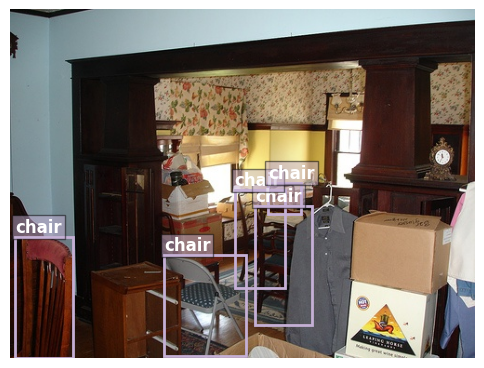

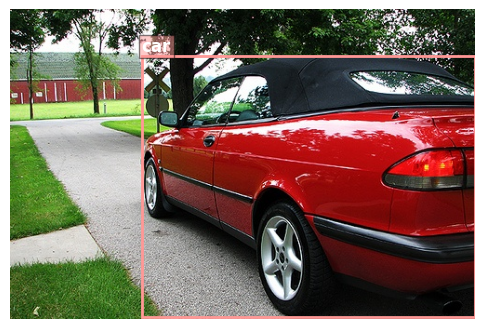

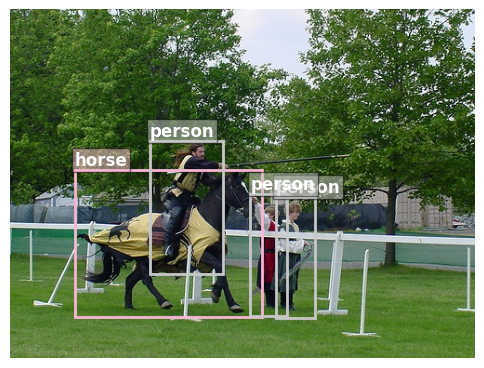

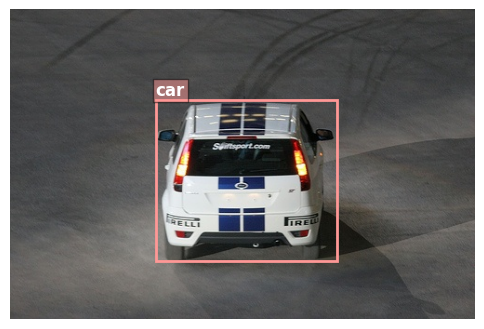

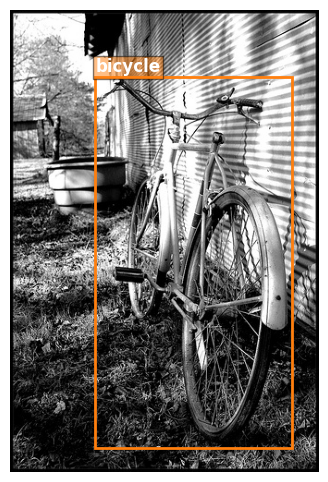

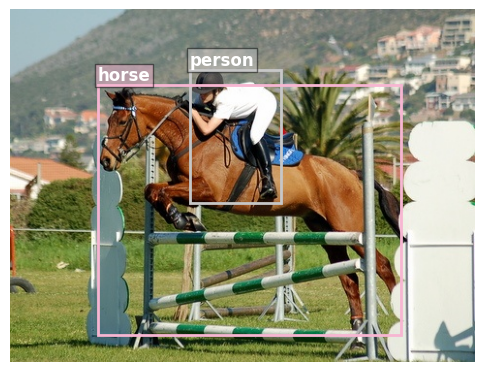

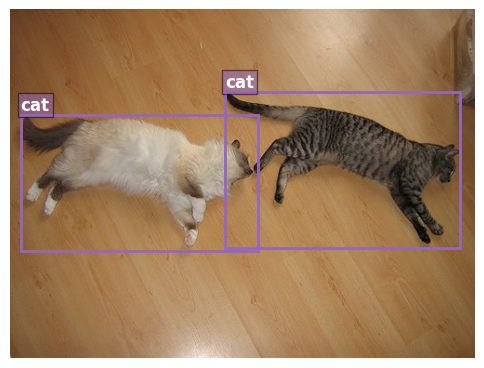

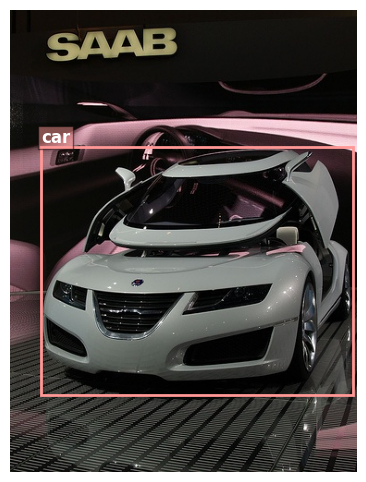

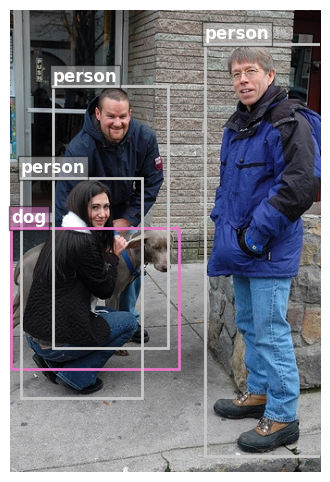

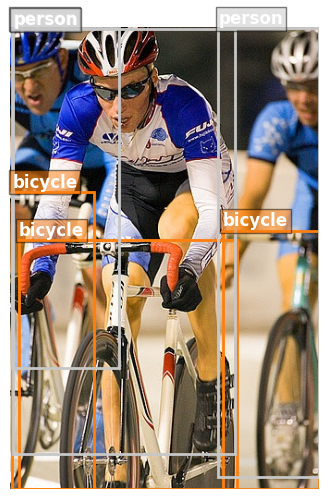

In [54]:
def show_sample(img, boxes, labels, classes):
    if isinstance(img, torch.Tensor):
        img_np = img.permute(1, 2, 0).cpu().numpy()
    else:
        img_np = np.array(img)

    fig, ax = plt.subplots(1, figsize=(6, 6))
    ax.imshow(img_np)

    if isinstance(boxes, torch.Tensor):
        boxes = boxes.cpu().numpy()
    if isinstance(labels, torch.Tensor):
        labels = labels.cpu().numpy()

    cmap = plt.get_cmap('tab20')

    for box, label_idx in zip(boxes, labels):
        xmin, ymin, xmax, ymax = box
        width = xmax - xmin
        height = ymax - ymin

        class_name = classes[label_idx]
        color = cmap(label_idx % 20)

        rect = patches.Rectangle(
            (xmin, ymin), width, height,
            linewidth=2, edgecolor=color, facecolor='none'
        )
        ax.add_patch(rect)

        ax.text(
            xmin, ymin - 5, class_name,
            bbox=dict(facecolor=color, alpha=0.5, pad=2),
            fontsize=12, color='white', weight='bold'
        )

    plt.axis('off')
    plt.show()


for i in range(10):
    img, raw_target = dataset[i]
    target = voc_target_to_tensor(raw_target)
    show_sample(img, target['boxes'], target['labels'], CLASSES)

### b. Create dataframe

#### Selective Search — génération des proposals

##### Algorithme en deux temps

**Étape 1 — Oversegmentation (Felzenszwalb & Huttenlocher)**
- Segmentation par graphe, Union-Find, seuil adaptatif `τ(C) = k/|C|`
- Complexité `O(n log n)`
- Produit ~1000-3000 petits segments initiaux
- `k` petit → favorise la sursegmentation (recall > précision à ce stade)

**Étape 2 — Fusion hiérarchique greedy**
- À chaque itération : fusionner la paire de régions adjacentes la plus similaire
- Chaque fusion ajoute une nouvelle bounding box à la liste des proposals
- S'arrête quand il ne reste qu'une région (l'image entière)

##### Similarité combinée (4 critères)

```
sim(r_i, r_j) = a₁·s_color + a₂·s_texture + a₃·s_size + a₄·s_fill
```

| Critère | Formule | Rôle |
|---|---|---|
| `s_color` | intersection d'histogrammes HSV (75 bins) | robuste aux variations d'illumination |
| `s_texture` | intersection d'histogrammes HOG (240 bins) | capture la granulosité de surface |
| `s_size` | `1 - (size(r_i)+size(r_j))/size(image)` | force la fusion des petits segments en premier |
| `s_fill` | `1 - (espace gaspillé dans la bbox fusionnée)` | favorise les régions qui se "contiennent" bien |

Le papier original combine plusieurs stratégies en parallèle (espaces couleur différents : RGB, HSV, Lab...) puis fusionne les résultats — d'où le recall élevé (~96% sur VOC).

##### Limites historiques de Selective Search
- ~1-2s/image sur CPU — non parallélisable par image (un seul algo séquentiel)
- Non différentiable → pas d'entraînement end-to-end
- Génère des centaines de proposals redondantes → NMS obligatoire en sortie

C'est précisément ce goulot qui a motivé le **RPN** dans Faster R-CNN (réseau convolutionnel dense sur la feature map partagée, prédisant anchors + offsets en une passe GPU).

---


In [55]:
base_fpath = "/content/data/VOCdevkit/VOC2007/ImageSets/Layout/"
validation_fpath = os.path.join(base_fpath, "trainval.txt")

with open(validation_fpath, 'r') as f:
    trainval_lign = [l.split('\n')[0] for l in f]

split1 = int(0.8 * len(trainval_lign))
split2 = int(0.9 * len(trainval_lign))

train_ids = set(trainval_lign[:split1])
val_ids   = set(trainval_lign[split1:split2])
test_ids  = set(trainval_lign[split2:])

print(len(train_ids) , len(val_ids), len(test_ids))


516 65 65


In [56]:
def extract_candidates(img, min_ratio=0.05, max_ratio=1.0):
    candidates = []
    seen = set()
    _, regions = selectivesearch.selective_search(img, scale=500, min_size=100)

    img_area = np.prod(img.shape[:2])
    for r in regions:
        rect = r['rect']
        if rect in seen: continue
        if r['size'] < min_ratio * img_area: continue
        if r['size'] > max_ratio * img_area: continue

        x, y, w, h = rect
        candidates.append((x, y, x + w, y + h))
        seen.add(rect)

    return candidates

def extract_iou(boxA, boxB, epsilon=1e-5):
    x1 = np.max(boxA[0], boxB[0])
    y1 = np.max(boxA[1], boxB[1])
    x2 = np.min(boxA[2], boxB[2])
    y2 = np.min(boxA[3], boxB[3])

    W = (x2 - x1)
    H = (y2 - y1)

    if (W < 0) or (H < 0):
        return 0

    intersection = W * H
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    union = boxA_area + boxB_area - intersection
    iou = intersection / (union + epsilon)

    return iou

def extract_iou_matrix(candidates, gt_boxes):
    """
    candidates : (N, 4) array (x1,y1,x2,y2)
    gt_boxes   : (M, 4) array (x1,y1,x2,y2)
    Retourne   : (N, M) matrice IoU — entièrement vectorisée
    """
    x1 = np.maximum(candidates[:, None, 0], gt_boxes[None, :, 0])
    y1 = np.maximum(candidates[:, None, 1], gt_boxes[None, :, 1])
    x2 = np.minimum(candidates[:, None, 2], gt_boxes[None, :, 2])
    y2 = np.minimum(candidates[:, None, 3], gt_boxes[None, :, 3])

    intersection = np.clip(x2 - x1, 0, None) * np.clip(y2 - y1, 0, None)

    area_c = ((candidates[:, 2] - candidates[:, 0]) *
              (candidates[:, 3] - candidates[:, 1]))[:, None]
    area_g = ((gt_boxes[:, 2] - gt_boxes[:, 0]) *
              (gt_boxes[:, 3] - gt_boxes[:, 1]))[None, :]

    union = area_c + area_g - intersection
    return intersection / np.clip(union, 1e-9, None)

#### L'offset (delta) — la régression bbox

##### Ce que c'est et ce que ce n'est pas
L'offset n'est **pas** un tuple de coordonnées absolues — c'est une **différence normalisée** entre la proposal et la GT box la plus proche.

```python
delta = [(_x - cx), (_y - cy), (_X - cX), (_Y - cY)] / [W, H, W, H]
#         ↑ gauche    ↑ haut    ↑ droite   ↑ bas
```

- Si la proposal est parfaitement alignée → delta = `[0,0,0,0]`
- Normalisé par `[W,H,W,H]` → indépendant de la résolution de l'image
- Bornes typiques observées : `[-0.3, +0.3]`

##### Pourquoi un offset plutôt que des coordonnées absolues
- Coordonnées absolues varient énormément selon la taille image → gradients instables
- Offset normalisé reste petit et borné → SmoothL1 fonctionne dans son régime optimal
- Le modèle apprend une tâche **stable et généralisable** : "corriger une approximation", pas "localiser depuis zéro"

##### Décodage à l'inférence
```python
final_box = roi_normalisée + delta_prédit          # addition simple
final_box_pixels = final_box * [W, H, W, H]
```

In [57]:
import cv2
import warnings

def extract_candidate_infos(best_iou, best_at, candidate, gt_arr, norm, labels, fpath):
    if best_iou >= 0.3:
        label_id = int(labels[best_at])
        delta    = (gt_arr[best_at] - candidate) / norm
        gt_box   = gt_arr[best_at] / norm
    else:
        label_id = 0
        delta    = np.zeros(4, dtype=np.float32)
        gt_box   = np.zeros(4, dtype=np.float32)

    return {
        'fpath':  fpath,
        'roi':    (candidate / norm).tolist(),
        'delta':  delta.tolist(),
        'label':  label_id,
        'iou':    float(best_iou),
        'gt_box': gt_box.tolist(),
    }

def extract_selective_search(img):
    """Fallback avec la lib Python si cv2.ximgproc.segmentation indisponible."""
    _, regions = selectivesearch.selective_search(img, scale=200, min_size=100)
    return [(r['rect'][0], r['rect'][1], r['rect'][2], r['rect'][3])
            for r in regions]

def process_one_image(args):
    fpath, gt_boxes, labels = args

    img = cv2.imread(fpath)
    if img is None:
        return []
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.uint8)
    H, W, _ = img.shape
    norm    = np.array([W, H, W, H], dtype=np.float32)

    # Un seul appel, format final déjà (x1,y1,x2,y2)
    candidates = extract_candidates(img)
    if len(candidates) == 0:
        return []

    candidates = np.array(candidates, dtype=np.float32)
    gt_arr     = np.array(gt_boxes,   dtype=np.float32)

    ious     = extract_iou_matrix(candidates, gt_arr)
    best_at  = ious.argmax(axis=1)
    best_iou = ious.max(axis=1)

    rows = []
    for j in range(len(candidates)):
        infos = extract_candidate_infos(
            best_iou[j], best_at[j], candidates[j],
            gt_arr, norm, labels, fpath,
        )
        rows.append(infos)
    return rows


In [58]:
from multiprocessing import Pool

label2target = {name: i for i, name in enumerate(CLASSES)}
target2label = {i: name for i, name in enumerate(CLASSES)}

def build_dataframe(ds, N=5000, n_workers=4):
    samples = []
    for ix, (img, raw_target) in enumerate(tqdm(ds, total=N)):
        if ix == N: break
        annotation = voc_target_to_tensor(raw_target)
        fpath = os.path.join(
            data_dir, "JPEGImages",
            raw_target["annotation"]["filename"]
        )
        samples.append((
            fpath,
            annotation['boxes'].tolist(),
            annotation['labels'],
        ))

    rows = []
    with Pool(n_workers) as pool:
        for image_rows in tqdm(
            pool.imap(process_one_image, samples, chunksize=4),
            total=len(samples),
            desc="Selective Search"
        ):
            rows.extend(image_rows)

    df = pd.DataFrame(rows)
    return df, label2target



# df_rg, label2target = build_dataframe(dataset, N=5000, n_workers=8)
# df_rg.to_pickle('rcnn_dataset.pkl')
# with open('label2target.pkl', 'wb') as f:
#     pickle.dump(label2target, f)

# load from
df_rg = pd.read_pickle("/content/rcnn_dataset.pkl")
df_rg.head(10)

,fpath,roi,delta,label,iou,gt_box
0,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.0860000029206276, 0.0, 0.9980000257492065, ...","[0.0, 0.0, 0.0, 0.0]",0,0.028833,"[0.0, 0.0, 0.0, 0.0]"
1,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.13600000739097595, 0.03733333200216293, 0.9...","[0.0, 0.0, 0.0, 0.0]",0,0.054281,"[0.0, 0.0, 0.0, 0.0]"
2,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3100000023841858, 0.20266667008399963, 0.52...","[0.0, 0.0, 0.0, 0.0]",0,0.017787,"[0.0, 0.0, 0.0, 0.0]"
3,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.10999999940395355, 0.7120000123977661, 0.37...","[0.0, 0.0, 0.0, 0.0]",0,0.108359,"[0.0, 0.0, 0.0, 0.0]"
4,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.10999999940395355, 0.7120000123977661, 0.44...","[0.0, 0.0, 0.0, 0.0]",0,0.284712,"[0.0, 0.0, 0.0, 0.0]"
5,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3100000023841858, 0.20266667008399963, 0.52...","[0.0, 0.0, 0.0, 0.0]",0,0.035055,"[0.0, 0.0, 0.0, 0.0]"
6,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3140000104904175, 0.15466666221618652, 0.75...","[0.0, 0.0, 0.0, 0.0]",0,0.002325,"[0.0, 0.0, 0.0, 0.0]"
7,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3100000023841858, 0.15466666221618652, 0.75...","[0.0, 0.0, 0.0, 0.0]",0,0.043627,"[0.0, 0.0, 0.0, 0.0]"
8,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3100000023841858, 0.15466666221618652, 0.75...","[0.0, 0.0, 0.0, 0.0]",0,0.064082,"[0.0, 0.0, 0.0, 0.0]"
9,/content/data/VOCdevkit/VOC2007/JPEGImages/000...,"[0.3100000023841858, 0.15466666221618652, 0.75...","[0.0, 0.0, 0.0, 0.0]",0,0.101613,"[0.0, 0.0, 0.0, 0.0]"


In [59]:
len(df_rg)

91221

### c. Create Dataloaders

In [60]:
from torch.utils.data import Dataset, DataLoader

class RCNNDataset(Dataset):
    def __init__(self, df, train=True):
        self.df = df.reset_index(drop=True)
        self.train = train
        self.normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
        # ── Seulement colorimétrique — sûr, ne touche jamais aux coordonnées
        self.color_jitter = transforms.ColorJitter(
            brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05
        )
        self.flip_prob = 0.5

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        img = cv2.imread(row['fpath'])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W, _ = img.shape

        x1, y1, x2, y2 = (np.array(row['roi']) * [W, H, W, H]).astype(int)
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(W, x2), min(H, y2)
        crop = img[y1:y2, x1:x2]
        if crop.size == 0:
            crop = np.zeros((224, 224, 3), dtype=np.uint8)
        crop = cv2.resize(crop, (224, 224))

        delta = np.array(row['delta'], dtype=np.float32)

        # ── Flip géométrique — coordonné entre crop ET delta
        if self.train and np.random.rand() < self.flip_prob:
            crop = crop[:, ::-1, :].copy()   # flip horizontal numpy
            # dx s'inverse de signe ; dy, dw, dh restent identiques
            delta = np.array([-delta[0], delta[1], delta[2], delta[3]], dtype=np.float32)

        crop = torch.tensor(crop / 255.0, dtype=torch.float32).permute(2, 0, 1)

        # ── Colorimétrique uniquement en train, jamais en val/test
        if self.train:
            crop = self.color_jitter(crop)

        crop = self.normalize(crop)

        label  = torch.tensor(row['label'], dtype=torch.long)
        delta  = torch.tensor(delta, dtype=torch.float32)
        roi    = torch.tensor(row['roi'],    dtype=torch.float32)
        gt_box = torch.tensor(row['gt_box'], dtype=torch.float32)

        return {
            'crop': crop,
            'label': label,
            'delta': delta,
            'roi': roi,
            'gt_box': gt_box
        }



In [61]:
import numpy as np

df_rg['image_id'] = df_rg['fpath'].apply(lambda x: x.split('/')[-1].split('.')[0])
# 1. Get all unique image IDs present in your 91k proposals
all_image_ids = df_rg['image_id'].unique()
np.random.seed(42)  # For reproducibility
np.random.shuffle(all_image_ids)

# 2. Define split sizes (80% train, 10% val, 10% test)
n_images = len(all_image_ids)
split1 = int(0.8 * n_images)
split2 = int(0.9 * n_images)

# 3. Create the sets of IDs
train_ids = set(all_image_ids[:split1])
val_ids   = set(all_image_ids[split1:split2])
test_ids  = set(all_image_ids[split2:])

# 4. Filter the main dataframe using these sets
df_train = df_rg[df_rg['image_id'].isin(train_ids)].reset_index(drop=True)
df_val   = df_rg[df_rg['image_id'].isin(val_ids)].reset_index(drop=True)
df_test  = df_rg[df_rg['image_id'].isin(test_ids)].reset_index(drop=True)

print(f"Total unique images: {n_images}")
print(f"Train proposals: {len(df_train)} ({len(train_ids)} images)")
print(f"Val proposals:   {len(df_val)} ({len(val_ids)} images)")
print(f"Test proposals:  {len(df_test)} ({len(test_ids)} images)")
print(f"Total proposals check: {len(df_train) + len(df_val) + len(df_test)}")

Total unique images: 5000
Train proposals: 72608 (4000 images)
Val proposals:   9359 (500 images)
Test proposals:  9254 (500 images)
Total proposals check: 91221


In [62]:
train_ds = RCNNDataset(df_train)
val_ds = RCNNDataset(df_test)

class_counts = df_train['label'].value_counts()
weights = df_train['label'].apply(lambda x: 1.0 / class_counts[x]).values
sampler = WeightedRandomSampler(
    weights=torch.tensor(weights, dtype=torch.float32),
    num_samples=len(df_train),
    replacement=True
)

train_loader = DataLoader(train_ds, batch_size=32,
                          sampler=sampler,
                          num_workers=2,
                          pin_memory=True)

val_loader = DataLoader(val_ds, batch_size=32,
                        shuffle=False,
                        num_workers=2,
                        pin_memory=True)

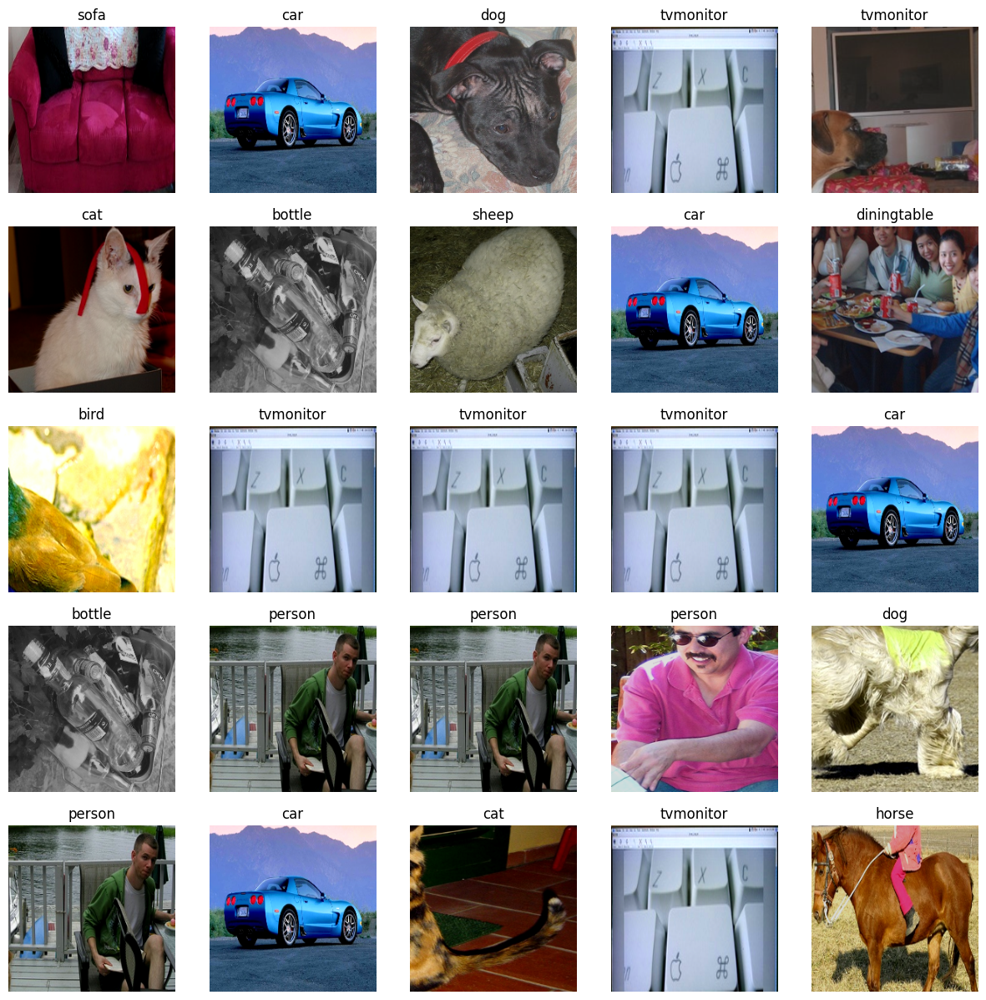

In [63]:
def show_batch(batch, rows=5, cols=5):
    crops = batch["crop"]
    labels = batch["label"]
    deltas = batch["delta"]

    figure = plt.figure(figsize=(rows*3, cols*3))
    cols, rows = cols, rows

    for i in range(1, cols * rows + 1):
        sample_idx = torch.randint(len(crops), size=(1,)).item()
        crop = crops[sample_idx]
        label = labels[sample_idx]

        crop = crop.permute(1, 2, 0).numpy()
        # denormalize
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        crop = std * crop + mean
        label = target2label[label.item()]

        figure.add_subplot(rows, cols, i)
        plt.title(label)
        plt.axis("off")
        plt.imshow(crop)

    plt.show()
    plt.close()

sample = next(iter(train_loader))
show_batch(sample)

## Model



### Architecture du modèle — deux têtes sur backbone partagé

#### Le pattern multi-tête — analogie retenue
Identique au cas "prédire genre (catégoriel) + âge (continu) depuis un visage" : une tête classification (Softmax+CE), une tête régression (SmoothL1), reliées uniquement par le backbone partagé. Les gradients des deux têtes tirent le backbone dans des directions différentes — le backbone apprend le compromis.

#### Pourquoi deux têtes séparées et pas une seule
Classification (discrète, CE) et régression (continue, SmoothL1) ont des magnitudes de gradient incompatibles — les combiner dans une seule tête créerait un conflit d'optimisation.

---

### La loss — formule et justification

```
L_total = L_cls + λ · L_bbox(masquée)

L_cls  = CrossEntropy(pred_cls, label)                    # TOUTES les proposals
L_bbox = SmoothL1(pred_delta[positifs], delta[positifs])   # SEULEMENT IoU ≥ seuil
```

#### Pourquoi masquer la loss bbox sur les négatifs
Demander au réseau de prédire un offset vers un objet qui n'existe pas (background) n'a pas de sens — la loss de régression doit être restreinte aux proposals positives.








In [64]:
import torch.nn as nn
from torchvision.models import resnet50

import torch.nn as nn
from torchvision.models import resnet50

class RCNN(nn.Module):
    def __init__(self, num_classes):
        super(RCNN, self).__init__()

        # ── Backbone ResNet50
        self.backbone = resnet50(pretrained=True)
        self.backbone.fc = nn.Identity()

        # ── Freeze le backbone
        for param in self.backbone.parameters():
            param.requires_grad = False

        for param in self.backbone.layer4.parameters():
            param.requires_grad = True

        # ── Tête classification
        self.cls_head = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes),
        )

        # ── Tête régression bbox
        self.bbox_head = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 4),
        )

    def forward(self, crops):
        features   = self.backbone(crops)
        cls_logits = self.cls_head(features)
        bbox_preds = self.bbox_head(features)
        return cls_logits, bbox_preds




rcnn_model = RCNN(num_classes=len(CLASSES))
rcnn_model.to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 172MB/s]


RCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0

## Train

In [65]:
class RCNNLoss(nn.Module):
    def __init__(self, lambda_loss=10):
        super(RCNNLoss, self).__init__()
        self.cls_loss  = nn.CrossEntropyLoss()
        self.bbox_loss = nn.SmoothL1Loss()
        self.lam = lambda_loss

    def forward(self, cls_logits, bbox_preds, labels, deltas):
        loss_cls = self.cls_loss(cls_logits, labels)

        bbox_mask = labels > 0
        if bbox_mask.sum() == 0:
            loss_bbox = torch.tensor(0.0, device=cls_logits.device)
        else:
            loss_bbox = self.bbox_loss(bbox_preds[bbox_mask], deltas[bbox_mask])

        loss = loss_cls + self.lam * loss_bbox
        return {
            'loss': loss,
            'loss_cls': loss_cls,
            'loss_bbox': loss_bbox,
        }

In [66]:
from collections import defaultdict
import copy

num_epochs = 5
lr_head = 1e-3
lr_backbone = 1e-5
optimizer = torch.optim.Adam([
    {'params': rcnn_model.backbone.layer4.parameters(), 'lr': lr_backbone},
    {'params': rcnn_model.cls_head.parameters(), 'lr': lr_head},
    {'params': rcnn_model.bbox_head.parameters(), 'lr': lr_head},
], weight_decay=5e-4)
criterion = RCNNLoss()


def train_one_batch(crops, labels, deltas):
    optimizer.zero_grad()
    cls_logits, bbox_preds = rcnn_model(crops)
    loss = criterion(cls_logits, bbox_preds, labels, deltas)
    loss['loss'].backward()
    optimizer.step()
    return loss


@torch.no_grad()
def evaluate_one_batch(crops, labels, deltas):
    cls_logits, bbox_preds = rcnn_model(crops)
    return criterion(cls_logits, bbox_preds, labels, deltas)


def run_epoch(loader, step_fn):
    accumulated = defaultdict(list)
    for batch in loader:
        crops  = batch["crop"].to(device)
        labels = batch["label"].to(device)
        deltas = batch["delta"].to(device)

        loss_dict = step_fn(crops, labels, deltas)
        for key, value in loss_dict.items():
            accumulated[key].append(value.item())

    return {key: np.mean(values) for key, values in accumulated.items()}


history = defaultdict(list)

best_model = None
best_loss = float('inf')

for epoch in tqdm(range(num_epochs)):
    rcnn_model.train()
    train_metrics = run_epoch(train_loader, train_one_batch)

    rcnn_model.eval()
    val_metrics = run_epoch(val_loader, evaluate_one_batch)

    for key, value in train_metrics.items():
        history[f'train_{key}'].append(value)
    for key, value in val_metrics.items():
        history[f'val_{key}'].append(value)

    if val_metrics['loss'] < best_loss:
        best_loss = val_metrics['loss']
        best_model = copy.deepcopy(rcnn_model.state_dict())

    print(f"Epoch {epoch+1}/{num_epochs} "
          f"Train Loss: {train_metrics['loss']:.4f} "
          f"Validation Loss: {val_metrics['loss']:.4f}")

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5 Train Loss: 0.6476 Validation Loss: 1.5166
Epoch 2/5 Train Loss: 0.4175 Validation Loss: 1.4702
Epoch 3/5 Train Loss: 0.3558 Validation Loss: 1.1583
Epoch 4/5 Train Loss: 0.3161 Validation Loss: 1.1685
Epoch 5/5 Train Loss: 0.2886 Validation Loss: 1.2056


## Evaluate model

In [67]:
!pip install -q torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 25.2 MB/s eta 0:00:00


In [68]:
from torchvision import transforms
from torchvision.ops import nms
from torchmetrics.detection import MeanAveragePrecision
from collections import defaultdict


### a. Compare loss


In [69]:
train_loss = history['train_loss']
validation_loss = history['val_loss']

train_loss_cls = history['train_loss_cls']
validation_loss_cls = history['val_loss_cls']

train_loss_bbox = history['train_loss_bbox']
validation_loss_bbox = history['val_loss_bbox']

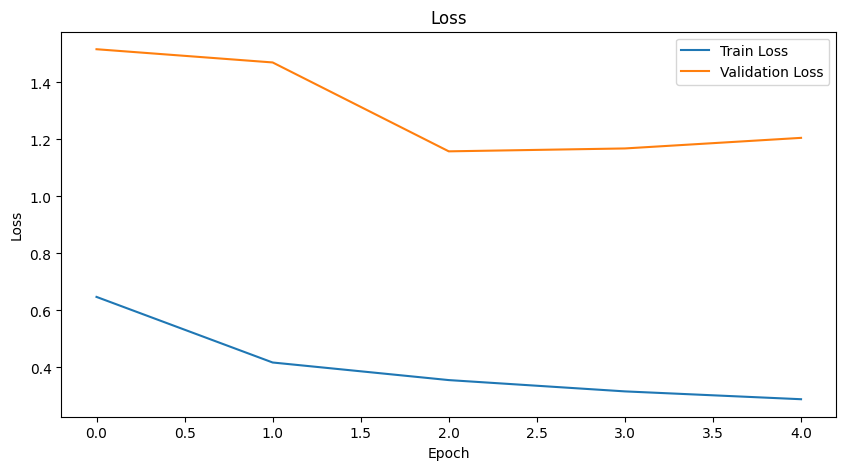

In [70]:
# Plot loss train vs validation
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Train Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title("Loss")
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

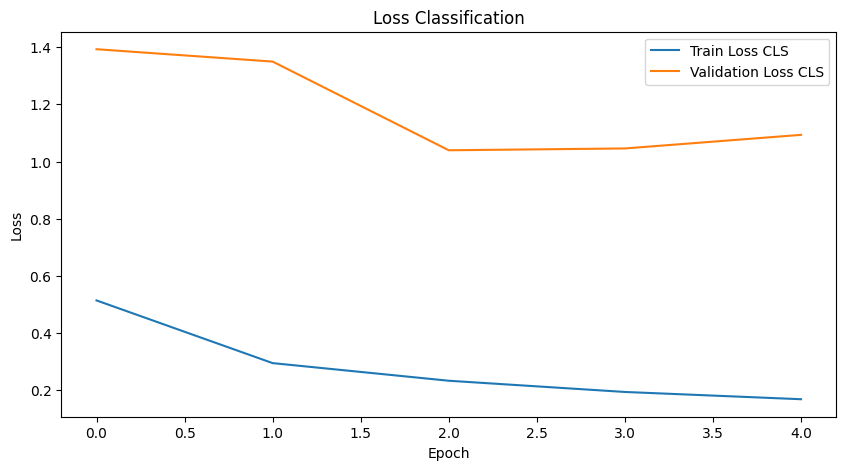

In [71]:
# Plot loss cls train vs validation
plt.figure(figsize=(10, 5))
plt.plot(train_loss_cls, label='Train Loss CLS')
plt.plot(validation_loss_cls, label='Validation Loss CLS')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Classification')
plt.legend()
plt.show()

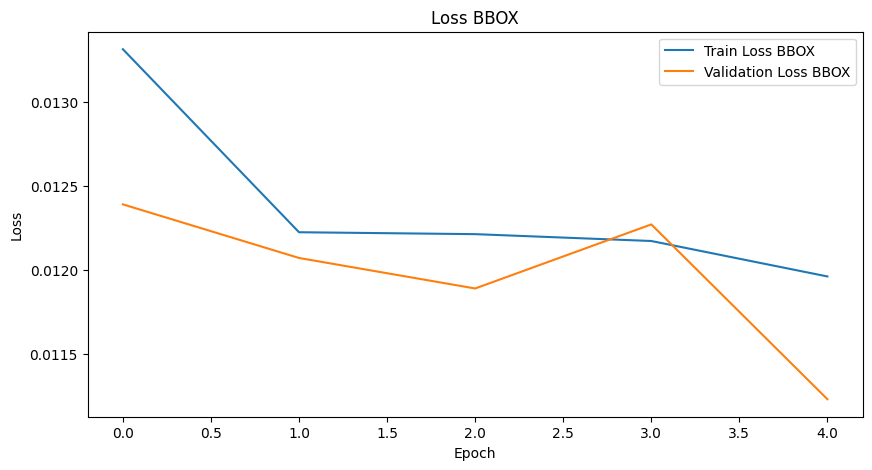

In [72]:
# Plot loss bbox train vs validation
plt.figure(figsize=(10, 5))
plt.plot(train_loss_bbox, label='Train Loss BBOX')
plt.plot(validation_loss_bbox, label='Validation Loss BBOX')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss BBOX')
plt.legend()
plt.show()

### b. Compute mAP

In [73]:
class MAPCompute:
    """
    Pipeline complet d'évaluation mAP pour le modèle R-CNN.

    Phase I (par image)  : crop → inference → decode → filter → NMS
    Phase II (global)    : accumulation TP/FP par classe → AP → mAP
    """

    def __init__(self, rcnn_model, device, target2label, gt_by_image,
                 score_thresh=0.5, nms_iou_thresh=0.5):
        self.rcnn_model      = rcnn_model
        self.device          = device
        self.target2label    = target2label   # {0: 'background', 1: 'aeroplane', ...}
        self.gt_by_image     = gt_by_image     # {image_id: {'boxes':Tensor, 'labels':Tensor}}
        self.score_thresh    = score_thresh
        self.nms_iou_thresh  = nms_iou_thresh

        self.normalize = transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
        self.metric = MeanAveragePrecision(box_format='xyxy', class_metrics=True)

    # ────────────────────────────────────────────────────────────
    # Étape 1 — extraction pixel + normalisation
    # ────────────────────────────────────────────────────────────

    def warp_crop(self, img, roi, W, H):
        """Découpe la région normalisée `roi` dans l'image et la redimensionne à 224×224.
        Séparé de preprocess_crop : ici on manipule des pixels bruts (numpy),
        preprocess_crop ne fait que la conversion tensor + normalisation ImageNet.
        """
        x1, y1, x2, y2 = (np.array(roi) * [W, H, W, H]).astype(int)
        x1, y1 = max(0, x1), max(0, y1)
        x2, y2 = min(W, x2), min(H, y2)
        crop = img[y1:y2, x1:x2]
        if crop.size == 0:
            crop = np.zeros((224, 224, 3), dtype=np.uint8)
        return cv2.resize(crop, (224, 224))

    def preprocess_crop(self, crop):
        """numpy (224,224,3) uint8 → tensor (3,224,224) normalisé ImageNet."""
        crop = torch.tensor(crop / 255.0, dtype=torch.float32).permute(2, 0, 1)
        return self.normalize(crop)

    def extract_crops_batch(self, img, rois, W, H):
        """Construit le batch de crops prêts pour le modèle, pour TOUTES les
        candidates d'une image en une fois."""
        crops = [self.preprocess_crop(self.warp_crop(img, roi, W, H)) for roi in rois]
        return torch.stack(crops)

    # ────────────────────────────────────────────────────────────
    # Étape 2 — inference modèle
    # ────────────────────────────────────────────────────────────

    def rcnn_inference(self, crops):
        """Passe un batch de crops dans le modèle, retourne les sorties brutes."""
        self.rcnn_model.eval()
        with torch.no_grad():
            cls_logits, bbox_preds = self.rcnn_model(crops.to(self.device))
        return {'cls_logits': cls_logits, 'bbox_preds': bbox_preds}

    # ────────────────────────────────────────────────────────────
    # Étape 3 — décodage des boîtes
    # ────────────────────────────────────────────────────────────

    def get_final_bbox(self, roi, offset):
        """roi normalisée + offset prédit → boîte finale normalisée.
        Addition simple : c'est exactement l'inverse du calcul du delta
        fait pendant la préparation du dataset."""
        return roi + offset

    # ────────────────────────────────────────────────────────────
    # Étape 4 — nettoyage des détections
    # ────────────────────────────────────────────────────────────

    def filter_candidates(self, boxes, scores, labels):
        """Retire le background et les détections peu confiantes."""
        mask = (labels > 0) & (scores > self.score_thresh)
        return boxes[mask], scores[mask], labels[mask]

    def compute_nms(self, boxes, scores, labels):
        """NMS appliqué PAR CLASSE — on ne fusionne jamais deux classes différentes
        même si leurs boîtes se chevauchent géométriquement."""
        if len(boxes) == 0:
            return boxes, scores, labels

        keep_boxes, keep_scores, keep_labels = [], [], []
        for cls_id in labels.unique():
            cls_mask    = labels == cls_id
            cls_boxes   = boxes[cls_mask]
            cls_scores  = scores[cls_mask]
            keep_idx    = nms(cls_boxes, cls_scores, self.nms_iou_thresh)

            keep_boxes.append(cls_boxes[keep_idx])
            keep_scores.append(cls_scores[keep_idx])
            keep_labels.append(torch.full((len(keep_idx),), cls_id,
                                           dtype=torch.long, device=boxes.device))

        return torch.cat(keep_boxes), torch.cat(keep_scores), torch.cat(keep_labels)

    # ────────────────────────────────────────────────────────────
    # Orchestration — pipeline complet pour UNE image
    # ────────────────────────────────────────────────────────────

    def process_image(self, image_id, group):
        fpath = group['fpath'].iloc[0]
        img   = cv2.cvtColor(cv2.imread(fpath), cv2.COLOR_BGR2RGB)
        H, W, _ = img.shape

        rois = group['roi'].tolist()
        crops = self.extract_crops_batch(img, rois, W, H)

        out = self.rcnn_inference(crops)
        probs = torch.softmax(out['cls_logits'], dim=1)
        scores, labels = probs.max(dim=1)

        rois_t = torch.tensor(rois, dtype=torch.float32).to(self.device)
        boxes  = self.get_final_bbox(rois_t, out['bbox_preds'])   # encore normalisé

        # ── Dénormaliser vers pixels — même espace que les GT
        scale = torch.tensor([W, H, W, H], dtype=torch.float32, device=self.device)
        boxes = boxes * scale

        # ── Clamp pour gérer les offsets qui pousseraient la boîte hors image
        boxes[:, 0::2] = boxes[:, 0::2].clamp(0, W)
        boxes[:, 1::2] = boxes[:, 1::2].clamp(0, H)

        boxes, scores, labels = self.filter_candidates(boxes, scores, labels)
        boxes, scores, labels = self.compute_nms(boxes, scores, labels)

        preds  = {'boxes': boxes.cpu(), 'scores': scores.cpu(), 'labels': labels.cpu()}
        target = self.gt_by_image.get(image_id, {'boxes': torch.zeros((0, 4)),
                                                  'labels': torch.zeros((0,), dtype=torch.long)})
        return preds, target

    # ────────────────────────────────────────────────────────────
    # Phase II — accumulation et calcul final
    # ────────────────────────────────────────────────────────────

    def __call__(self, df):
        """Point d'entrée principal. Boucle sur toutes les images du df,
        accumule les prédictions, puis calcule l'AP par classe + le mAP."""
        self.metric.reset()

        for image_id, group in df.groupby('image_id'):
            preds, target = self.process_image(image_id, group)
            self.metric.update([preds], [target])

        result = self.metric.compute()

        # ── Reformater en dict lisible {nom_classe: AP}
        ap_per_class = {}
        if 'map_per_class' in result:
            for cls_idx, ap in zip(result['classes'], result['map_per_class']):
                class_name = self.target2label[cls_idx.item()]
                ap_per_class[class_name] = ap.item()

        ap_per_class['mAP'] = result['map'].item()
        return ap_per_class

In [74]:
def build_gt_by_image(voc_dataset, target_ids, label2target):
    """
    voc_dataset  : le dataset VOCDetection brut (PAS df_test)
    target_ids   : set des image_id du split voulu (ex: test_ids)
    label2target : dict {nom_classe: index} pour encoder les labels en int
    """
    target_ids = set(target_ids)
    gt_by_image = {}

    for img, raw_target in voc_dataset:
        image_id = raw_target["annotation"]["filename"].split('.')[0]
        if image_id not in target_ids:
            continue

        annotation = voc_target_to_tensor(raw_target)

        gt_by_image[image_id] = {
            'boxes':  annotation['boxes'].clone().detach().float()
                      if torch.is_tensor(annotation['boxes'])
                      else torch.tensor(annotation['boxes'], dtype=torch.float32),
            'labels': torch.tensor(
                [label2target[l] if isinstance(l, str) else int(l)
                 for l in annotation['labels']],
                dtype=torch.long
            ),
        }

    return gt_by_image

gt_by_image = build_gt_by_image(dataset, test_ids, label2target)
gt_by_image

{'000016': {'boxes': tensor([[ 92.,  72., 305., 473.]]),
  'labels': tensor([2])},
 '000035': {'boxes': tensor([[  1.,  96., 191., 361.],
          [218.,  98., 465., 318.],
          [468., 195., 500., 317.],
          [  3., 304., 500., 375.]]),
  'labels': tensor([15, 15, 15, 11])},
 '000072': {'boxes': tensor([[ 40.,  71., 333., 473.],
          [ 33.,  42., 331., 136.]]),
  'labels': tensor([14, 14])},
 '000133': {'boxes': tensor([[ 73.,  18., 406., 500.],
          [135., 227., 338., 500.],
          [ 22.,   1.,  75., 101.],
          [ 42.,  58., 137., 104.]]),
  'labels': tensor([15, 13, 15, 13])},
 '000198': {'boxes': tensor([[160., 134., 286., 239.]]),
  'labels': tensor([19])},
 '000225': {'boxes': tensor([[125.,  96., 355., 263.],
          [  2.,  22.,  47.,  81.]]),
  'labels': tensor([17, 17])},
 '000229': {'boxes': tensor([[ 95., 209., 421., 375.],
          [399., 219., 486., 371.],
          [341., 161., 432., 298.],
          [384., 135., 437., 203.],
          [239

In [75]:
mapper = MAPCompute(
    rcnn_model=rcnn_model,
    device=device,
    target2label=target2label,
    gt_by_image=gt_by_image,
    score_thresh=0.5,
    nms_iou_thresh=0.5,
)

ap_results = mapper(df_test)
print(ap_results)

{'aeroplane': 0.2157602608203888, 'bicycle': 0.08814061433076859, 'bird': 0.05011169984936714, 'boat': 0.054456401616334915, 'bottle': 0.03237466514110565, 'bus': 0.11341787129640579, 'car': 0.09202242642641068, 'cat': 0.20530429482460022, 'chair': 0.017065363004803658, 'cow': 0.038751088082790375, 'diningtable': 0.13782690465450287, 'dog': 0.13096988201141357, 'horse': 0.08481556177139282, 'motorbike': 0.1095954179763794, 'person': 0.05507269129157066, 'pottedplant': 0.060371775180101395, 'sheep': 0.06581731140613556, 'sofa': 0.10452133417129517, 'train': 0.11277823895215988, 'tvmonitor': 0.10334158688783646, 'mAP': 0.09362576901912689}


In [76]:
rcnn_model_best = RCNN(num_classes=len(CLASSES))
rcnn_model_best.load_state_dict(best_model)
rcnn_model_best.to(device)

mapper_best = MAPCompute(
    rcnn_model=rcnn_model_best,
    device=device,
    target2label=target2label,
    gt_by_image=gt_by_image,
    score_thresh=0.05,
    nms_iou_thresh=0.6,
)

ap_results = mapper_best(df_test)
print(ap_results)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


{'aeroplane': 0.16897927224636078, 'bicycle': 0.08573874086141586, 'bird': 0.048967890441417694, 'boat': 0.06276976317167282, 'bottle': 0.019974758848547935, 'bus': 0.11095014214515686, 'car': 0.06834866106510162, 'cat': 0.2148900032043457, 'chair': 0.014899352565407753, 'cow': 0.025373252108693123, 'diningtable': 0.1640254259109497, 'dog': 0.1411433219909668, 'horse': 0.09081991761922836, 'motorbike': 0.13374097645282745, 'person': 0.04477187246084213, 'pottedplant': 0.05915500968694687, 'sheep': 0.06153561919927597, 'sofa': 0.09939758479595184, 'train': 0.10123926401138306, 'tvmonitor': 0.04984636232256889, 'mAP': 0.08832836151123047}


## Inférence

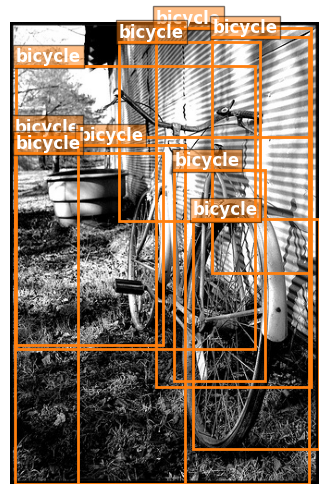

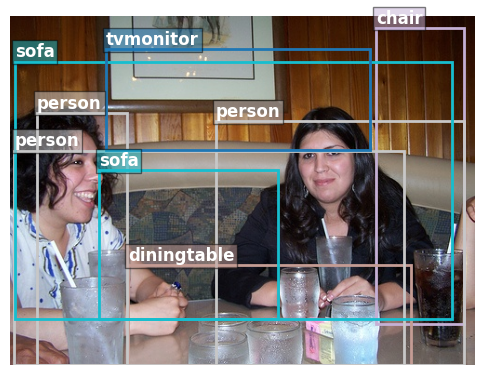

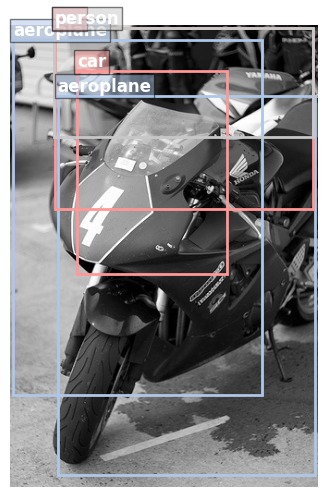

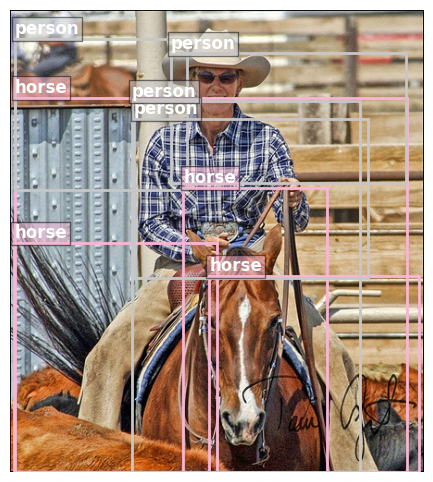

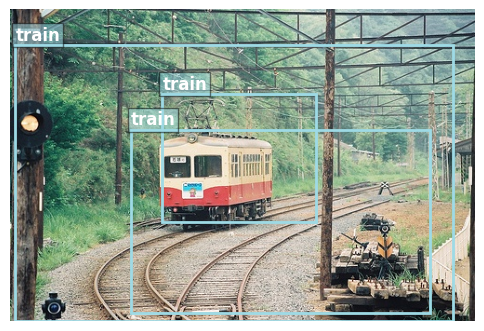

...

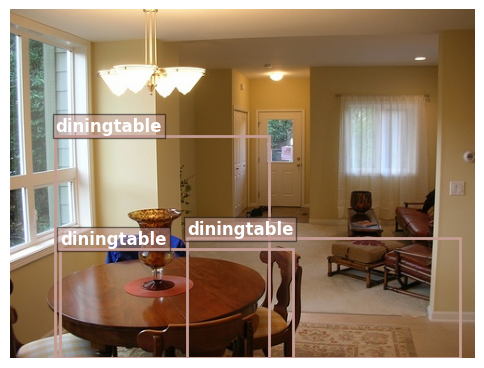

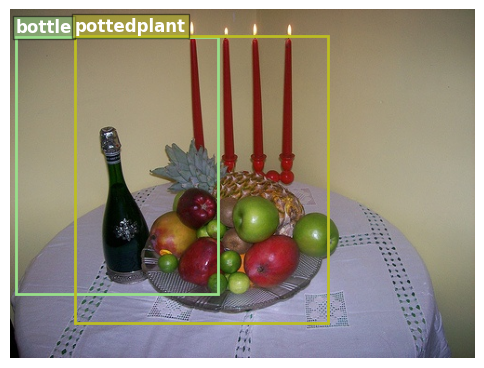

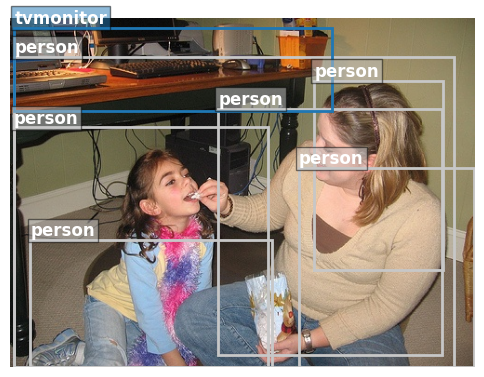

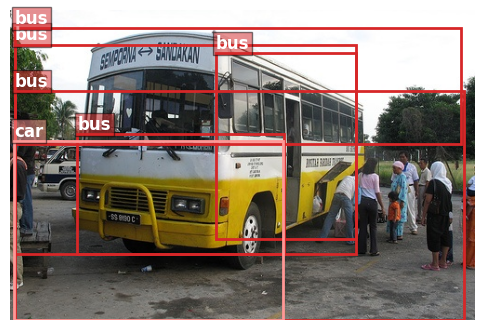

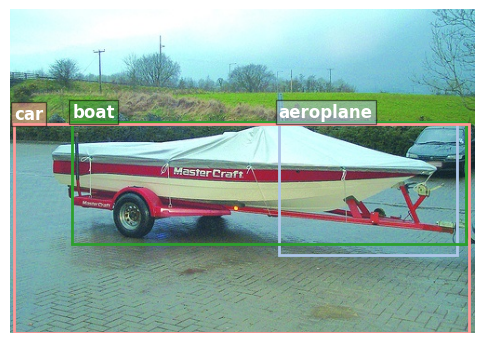

In [77]:
class RCNNInference:
    def __init__(self, rcnn_model, map_compute, df, save_path="/content/results/img"):
        self.rcnn_model = rcnn_model
        self.map_compute = map_compute
        self.target2label = target2label
        self.df = df
        self.save_path = save_path

        if not os.path.exists(self.save_path):
            os.makedirs(self.save_path)

    def __call__(self, img_path, show=True, save=True):
        name_img = img_path.split("/")[-1].split(".")[0]
        pred, target = self.map_compute.process_image(
              name_img,
              self.df[self.df.image_id == name_img]
        )

        if show:
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            show_sample(img, pred['boxes'], pred['labels'], CLASSES)
            if save:
                cv2.imwrite(f"{self.save_path}/{name_img}.jpg", cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

        return pred, target


for idx, (image_id, group) in enumerate(df_test.groupby('image_id')):
      img_path = group["fpath"].iloc[0]
      # img_path = df_test['fpath'].iloc[0]
      rcnn_inference = RCNNInference(rcnn_model, mapper, df_test)
      rcnn_inference(img_path, show=True)

      if idx > 10:break





## Comparaison avec les architectures suivantes

| Architecture | Proposals | Bbox regression | L_cls | Assignation positif |
|---|---|---|---|---|
| **R-CNN / Fast R-CNN** | Selective Search (CPU) | 1×, SmoothL1 masquée | CrossEntropy | IoU ≥ seuil unique |
| **Faster R-CNN** | RPN (GPU, dense conv) | 2× (RPN grossier + tête fine) | CE + BCE objectness | double seuil (0.7/0.3) + zone ignorée |
| **YOLO** | aucune — grille directe | 1×, par cellule | BCE/CE + confidence | cellule contenant le centre GT |
| **SSD** | anchors multi-échelle | 1×, SmoothL1 | CE + hard neg mining 1:3 | IoU avec anchors |
| **RetinaNet** | anchors denses | 1×, SmoothL1 | **Focal Loss** | anchors |
| **DETR/RT-DETR** | aucune — object queries | L1 + **GIoU** | CE | matching bipartite (Hongrois) |







## Glossaire rapide

| Terme | Définition |
|---|---|
| **Region proposal** | Boîte candidate générée par un algorithme catégorie-agnostique (Selective Search, RPN...) |
| **RoI** | Region of Interest — une proposal exprimée en coordonnées normalisées [0,1] |
| **Warp** | Redimensionnement (souvent avec déformation) d'une région à une taille fixe pour le CNN |
| **Delta / offset** | Différence normalisée entre une proposal et la GT box la plus proche |
| **IoU** | Intersection over Union — mesure de chevauchement géométrique entre deux boîtes |
| **NMS** | Non-Maximum Suppression — supprime les détections redondantes sur un même objet |
| **mAP** | mean Average Precision — moyenne des AP (aire sous courbe précision-rappel) sur toutes les classes |
| **Anchor** | Boîte de référence prédéfinie (taille/ratio fixes) que le RPN apprend à corriger |
| **Hard negative mining** | Échantillonnage forcé d'un ratio fixe positifs:négatifs par batch |
| **Focal Loss** | Variante de CE qui déprécie automatiquement les exemples faciles (résout le déséquilibre sans sampler) |